In [ ]:
import os
import random
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image, make_grid

from tqdm import tqdm
import lpips
from torchmetrics.image.fid import FrechetInceptionDistance

# Reproducibility
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Directories
os.makedirs("training_progress", exist_ok=True)
os.makedirs("checkpoints", exist_ok=True)

# Dataset
class Selfie2AnimeDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.selfie_dir = os.path.join(root, "trainA")
        self.anime_dir = os.path.join(root, "trainB")
        self.selfie_images = os.listdir(self.selfie_dir)
        self.anime_images = os.listdir(self.anime_dir)

    def __len__(self):
        return min(len(self.selfie_images), len(self.anime_images))

    def __getitem__(self, idx):
        selfie_path = os.path.join(self.selfie_dir, self.selfie_images[idx])
        anime_path = os.path.join(self.anime_dir, self.anime_images[idx])
        selfie = Image.open(selfie_path).convert("RGB")
        anime = Image.open(anime_path).convert("RGB")

        if self.transform:
            selfie = self.transform(selfie)
            anime = self.transform(anime)

        return selfie, anime

# Transform
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Paths
path_to_dataset = "/kaggle/input/selfie2anime"
dataset = Selfie2AnimeDataset(path_to_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)
fixed_batch = next(iter(DataLoader(dataset, batch_size=4, shuffle=False)))

# Models
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, 2, 1), nn.Tanh()
        )

    def forward(self, x): return self.net(x)

class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(128, 1, 4, 2, 1), nn.Sigmoid()
        )

    def forward(self, x): return self.net(x)

G = Generator().to(device)
F = Generator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Losses
criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()

# Optimizers
optimizer_G = optim.Adam(list(G.parameters()) + list(F.parameters()), lr=2e-4, betas=(0.5, 0.999))
optimizer_D_A = optim.Adam(D_A.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D_B = optim.Adam(D_B.parameters(), lr=2e-4, betas=(0.5, 0.999))

# Metrics
fid_metric = FrechetInceptionDistance(feature=64).to(device)
lpips_metric = lpips.LPIPS(net='vgg').to(device)

def calculate_metrics(G, dataloader, device, num_samples=100):
    G.eval()
    lpips_scores = []
    with torch.no_grad():
        for i, (real_A, real_B) in enumerate(dataloader):
            if i * real_A.size(0) >= num_samples: break
            real_A, real_B = real_A.to(device), real_B.to(device)
            fake_B = G(real_A)
            fid_metric.update(((real_B * 0.5 + 0.5) * 255).byte(), real=True)
            fid_metric.update(((fake_B * 0.5 + 0.5) * 255).byte(), real=False)
            lpips_scores.append(lpips_metric(fake_B, real_B).mean().item())
    fid_score = fid_metric.compute().item()
    fid_metric.reset()
    return fid_score, np.mean(lpips_scores)

def visualize(real_A, fake_B, rec_A, real_B, epoch, fid, lpips):
    real_A = (real_A * 0.5) + 0.5
    fake_B = (fake_B * 0.5) + 0.5
    rec_A = (rec_A * 0.5) + 0.5
    real_B = (real_B * 0.5) + 0.5

    grid = torch.cat([
        make_grid(real_A, nrow=4),
        make_grid(fake_B, nrow=4),
        make_grid(rec_A, nrow=4),
        make_grid(real_B, nrow=4)
    ], dim=1)

    save_image(grid, f"training_progress/epoch_{epoch:03d}_fid_{fid:.1f}_lpips_{lpips:.3f}.png")

    npimg = grid.cpu().numpy().transpose((1, 2, 0))
    plt.figure(figsize=(16, 6))
    plt.imshow(np.clip(npimg, 0, 1))
    plt.axis('off')
    plt.title(f"Epoch {epoch} | FID: {fid:.2f} | LPIPS: {lpips:.3f}")
    plt.show()

# Training
epochs = 100
early_stop_patience = 10
save_interval = 10
best_fid = float('inf')
no_improve = 0

for epoch in range(1, epochs + 1):
    start_time = time.time()
    G.train(); F.train()
    for real_A, real_B in tqdm(dataloader, desc=f"[Epoch {epoch}/{epochs}]"):
        real_A, real_B = real_A.to(device), real_B.to(device)

        # Train generators
        optimizer_G.zero_grad()
        fake_B, rec_A = G(real_A), F(G(real_A))
        fake_A, rec_B = F(real_B), G(F(real_B))
        loss_GAN_A = criterion_GAN(D_B(fake_B), torch.ones_like(D_B(fake_B)))
        loss_GAN_B = criterion_GAN(D_A(fake_A), torch.ones_like(D_A(fake_A)))
        loss_cycle_A = criterion_cycle(rec_A, real_A)
        loss_cycle_B = criterion_cycle(rec_B, real_B)
        loss_G = loss_GAN_A + loss_GAN_B + 10 * (loss_cycle_A + loss_cycle_B)
        loss_G.backward(); optimizer_G.step()

        # Train D_A
        optimizer_D_A.zero_grad()
        loss_D_A = 0.5 * (
            criterion_GAN(D_A(real_A), torch.ones_like(D_A(real_A))) +
            criterion_GAN(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A)))
        )
        loss_D_A.backward(); optimizer_D_A.step()

        # Train D_B
        optimizer_D_B.zero_grad()
        loss_D_B = 0.5 * (
            criterion_GAN(D_B(real_B), torch.ones_like(D_B(real_B))) +
            criterion_GAN(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B)))
        )
        loss_D_B.backward(); optimizer_D_B.step()

    # Evaluate
    fid_score, lpips_score = calculate_metrics(G, dataloader, device)
    G.eval(); F.eval()
    with torch.no_grad():
        real_A, real_B = fixed_batch
        real_A, real_B = real_A.to(device), real_B.to(device)
        fake_B, rec_A = G(real_A), F(G(real_A))
        visualize(real_A, fake_B, rec_A, real_B, epoch, fid_score, lpips_score)

    # Save checkpoint
    if epoch % save_interval == 0:
        torch.save(G.state_dict(), f"checkpoints/G_epoch_{epoch}.pt")
        torch.save(F.state_dict(), f"checkpoints/F_epoch_{epoch}.pt")

    # Early stopping
    if fid_score < best_fid:
        best_fid = fid_score
        no_improve = 0
    else:
        no_improve += 1
        if no_improve >= early_stop_patience:
            print(f"Early stopping triggered at epoch {epoch}.")
            break

    print(f"[Epoch {epoch}] Loss_G: {loss_G.item():.4f} | FID: {fid_score:.3f} | LPIPS: {lpips_score:.3f} | Time: {(time.time()-start_time)/60:.2f} min")


In [ ]:
pip install lpips torch-fidelity torchmetrics

In [ ]:
!zip -r ads.zip checkpoints


In [ ]:
import torch
import os
import numpy as np
import matplotlib.pyplot as plt
from torchvision.utils import make_grid, save_image
from torch.utils.data import DataLoader
from torchvision import transforms
from PIL import Image
from torch import nn

# Define the Generator (same as in training)
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, 2, 1), nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 4, 2, 1), nn.Tanh()
        )
    def forward(self, x):
        return self.net(x)

# Define transform
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Dataset class
class Selfie2AnimeDataset(torch.utils.data.Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.selfie_dir = os.path.join(root, "trainA")
        self.anime_dir = os.path.join(root, "trainB")
        self.selfie_images = os.listdir(self.selfie_dir)
        self.anime_images = os.listdir(self.anime_dir)

    def __len__(self):
        return min(len(self.selfie_images), len(self.anime_images))

    def __getitem__(self, idx):
        selfie_path = os.path.join(self.selfie_dir, self.selfie_images[idx])
        anime_path = os.path.join(self.anime_dir, self.anime_images[idx])
        selfie = Image.open(selfie_path).convert("RGB")
        anime = Image.open(anime_path).convert("RGB")
        if self.transform:
            selfie = self.transform(selfie)
            anime = self.transform(anime)
        return selfie, anime

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load dataset
dataset = Selfie2AnimeDataset("/kaggle/input/selfie2anime", transform=transform)
dataloader = DataLoader(dataset, batch_size=4, shuffle=True)
real_selfie, real_anime = next(iter(dataloader))
real_selfie, real_anime = real_selfie.to(device), real_anime.to(device)

# Load models
G = Generator().to(device)
F = Generator().to(device)
G.load_state_dict(torch.load("/kaggle/input/modelcheckpoint50/tensorflow2/default/1/G_epoch_50.pt", map_location=device))
F.load_state_dict(torch.load("/kaggle/input/f50/tensorflow2/default/1/F_epoch_50.pt", map_location=device))
G.eval(); F.eval()

# Translate
with torch.no_grad():
    anime_from_selfie = G(real_selfie)
    selfie_from_anime = F(real_anime)

# Denormalize
def denorm(x): return x * 0.5 + 0.5

# Concatenate image grid
grid = torch.cat([
    make_grid(denorm(real_selfie), nrow=4),
    make_grid(denorm(anime_from_selfie), nrow=4),
    make_grid(denorm(real_anime), nrow=4),
    make_grid(denorm(selfie_from_anime), nrow=4)
], dim=1)

# Save and display
os.makedirs("translation_results", exist_ok=True)
save_image(grid, "translation_results/sample_translation.png")
npimg = grid.cpu().numpy().transpose((1, 2, 0))
plt.figure(figsize=(16, 8))
plt.imshow(np.clip(npimg, 0, 1))
plt.axis("off")
plt.title("Real → Anime (Top) | Anime → Real (Bottom)")
plt.show()


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: /usr/local/lib/python3.11/dist-packages/lpips/weights/v0.1/vgg.pth


[Epoch 1/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


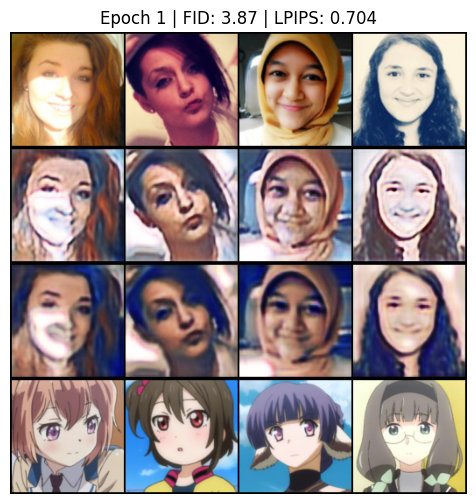

[Epoch 1] Loss_G: 5.0173 | FID: 3.871 | LPIPS: 0.704 | Time: 4.01 min


[Epoch 2/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


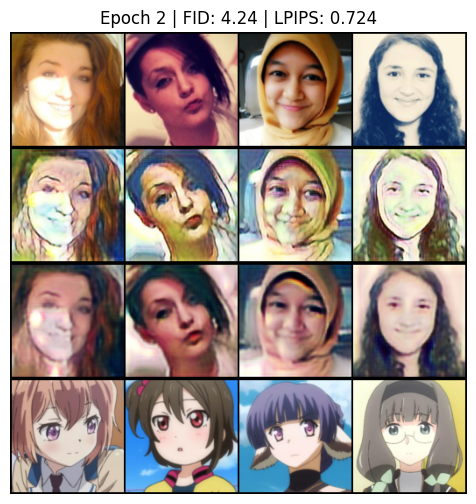

[Epoch 2] Loss_G: 3.5684 | FID: 4.242 | LPIPS: 0.724 | Time: 4.01 min


[Epoch 3/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


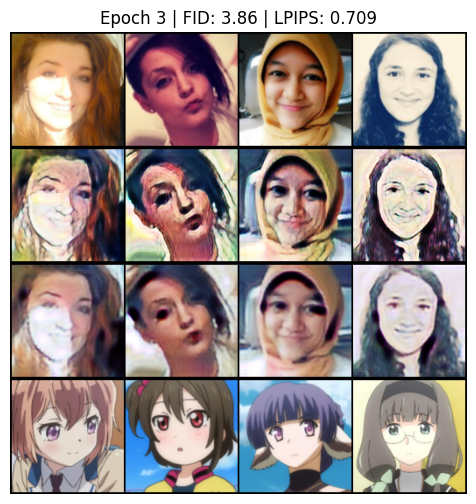

[Epoch 3] Loss_G: 4.3997 | FID: 3.856 | LPIPS: 0.709 | Time: 4.01 min


[Epoch 4/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


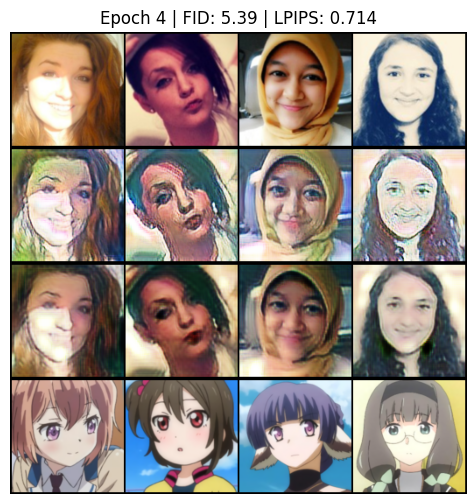

[Epoch 4] Loss_G: 4.3420 | FID: 5.386 | LPIPS: 0.714 | Time: 4.01 min


[Epoch 5/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


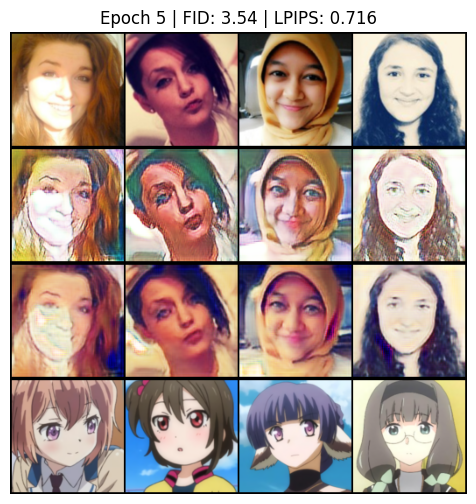

[Epoch 5] Loss_G: 4.0962 | FID: 3.536 | LPIPS: 0.716 | Time: 4.01 min


[Epoch 6/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


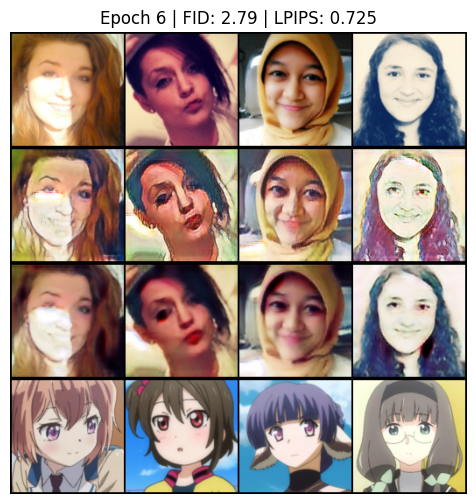

[Epoch 6] Loss_G: 3.7551 | FID: 2.793 | LPIPS: 0.725 | Time: 4.00 min


[Epoch 7/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


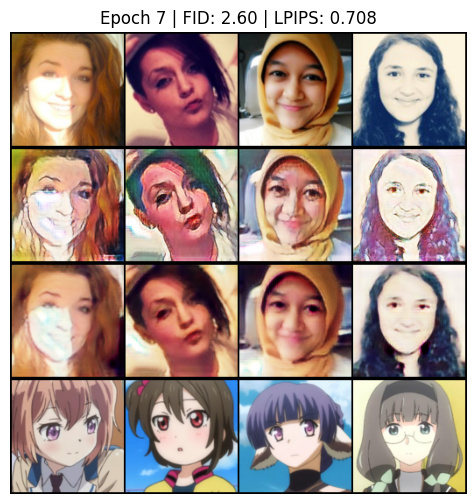

[Epoch 7] Loss_G: 4.0790 | FID: 2.601 | LPIPS: 0.708 | Time: 4.00 min


[Epoch 8/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


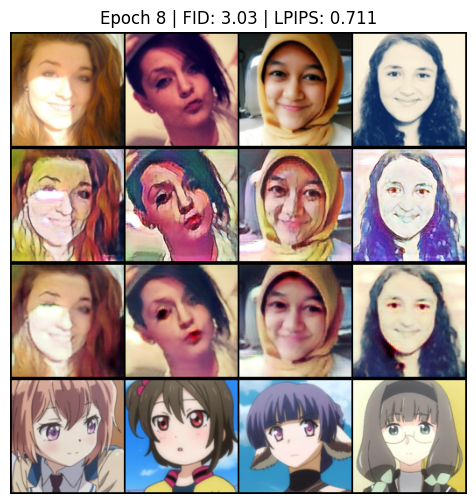

[Epoch 8] Loss_G: 3.3023 | FID: 3.034 | LPIPS: 0.711 | Time: 4.00 min


[Epoch 9/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


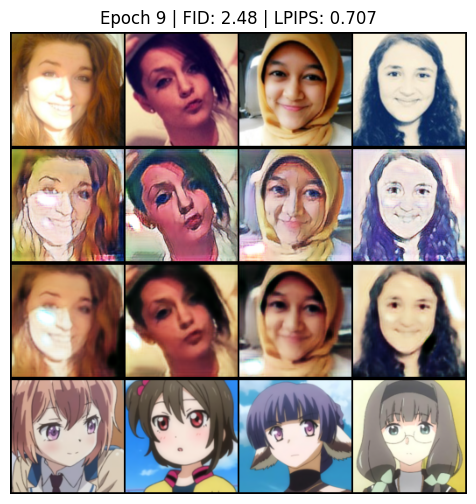

[Epoch 9] Loss_G: 3.7101 | FID: 2.477 | LPIPS: 0.707 | Time: 4.00 min


[Epoch 10/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


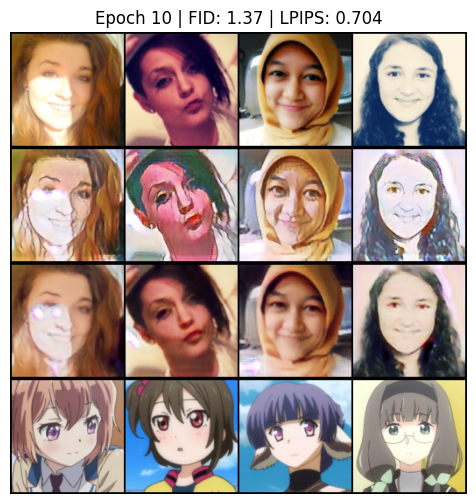

[Epoch 10] Loss_G: 4.6589 | FID: 1.372 | LPIPS: 0.704 | Time: 4.00 min


[Epoch 11/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


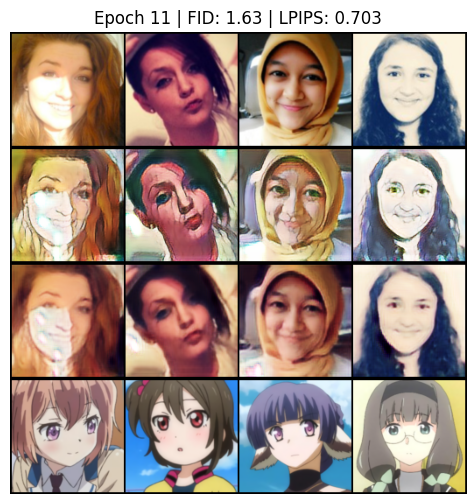

[Epoch 11] Loss_G: 3.4509 | FID: 1.631 | LPIPS: 0.703 | Time: 4.00 min


[Epoch 12/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


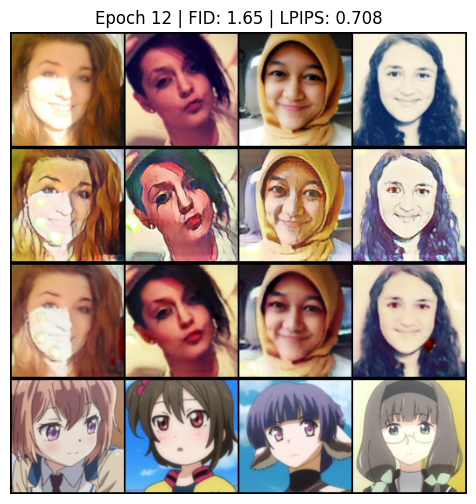

[Epoch 12] Loss_G: 3.0695 | FID: 1.648 | LPIPS: 0.708 | Time: 4.00 min


[Epoch 13/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


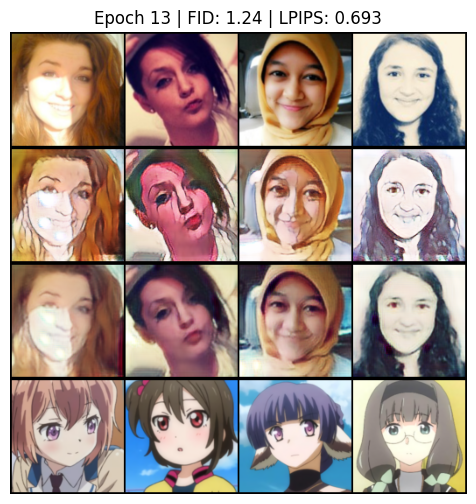

[Epoch 13] Loss_G: 3.3341 | FID: 1.238 | LPIPS: 0.693 | Time: 4.00 min


[Epoch 14/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


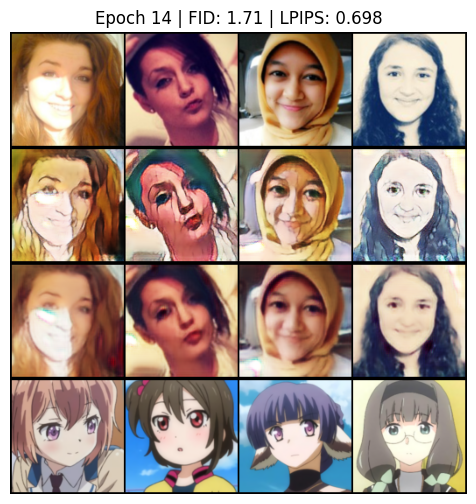

[Epoch 14] Loss_G: 3.6383 | FID: 1.713 | LPIPS: 0.698 | Time: 4.00 min


[Epoch 15/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


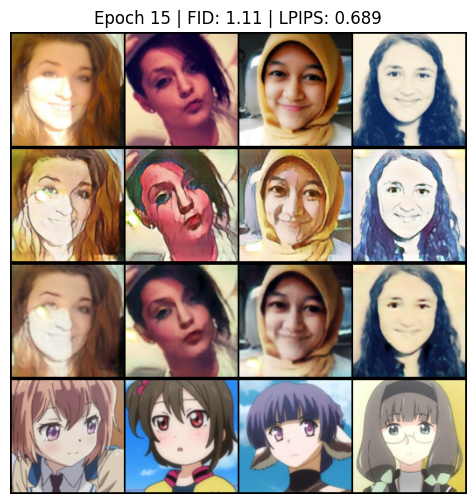

[Epoch 15] Loss_G: 3.1605 | FID: 1.112 | LPIPS: 0.689 | Time: 4.00 min


[Epoch 16/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


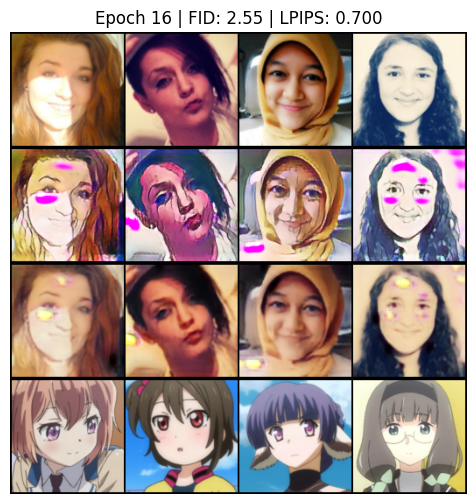

[Epoch 16] Loss_G: 3.6853 | FID: 2.554 | LPIPS: 0.700 | Time: 4.00 min


[Epoch 17/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


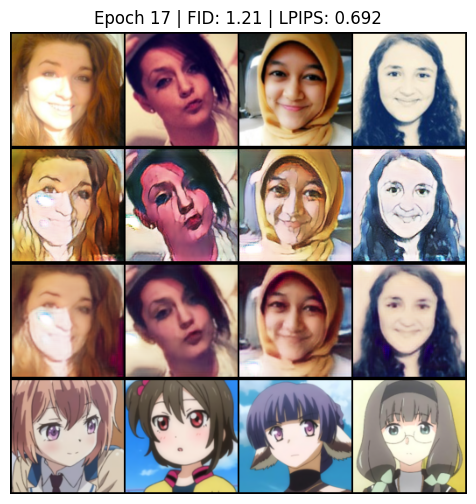

[Epoch 17] Loss_G: 3.2583 | FID: 1.207 | LPIPS: 0.692 | Time: 4.00 min


[Epoch 18/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


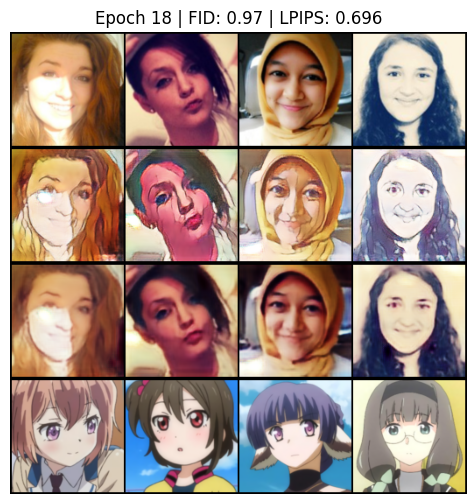

[Epoch 18] Loss_G: 3.1151 | FID: 0.969 | LPIPS: 0.696 | Time: 4.00 min


[Epoch 19/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


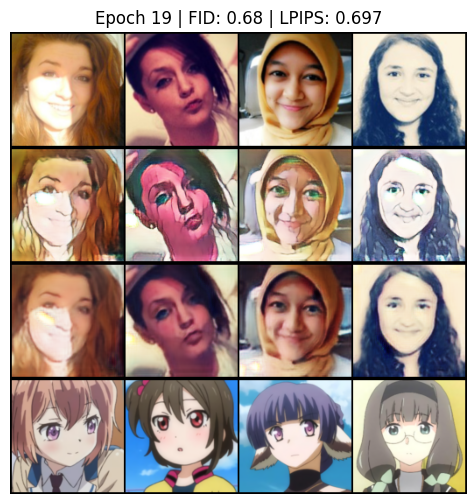

[Epoch 19] Loss_G: 2.9348 | FID: 0.683 | LPIPS: 0.697 | Time: 4.00 min


[Epoch 20/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


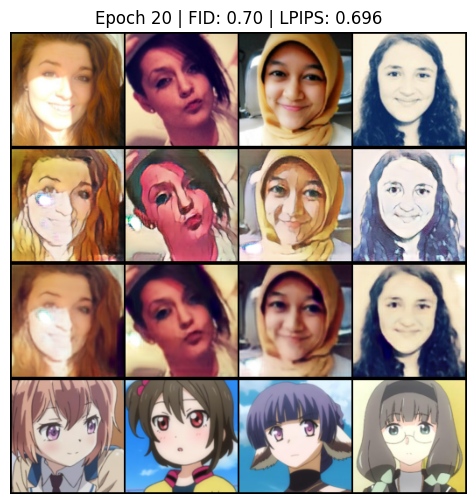

[Epoch 20] Loss_G: 3.0272 | FID: 0.701 | LPIPS: 0.696 | Time: 4.00 min


[Epoch 21/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


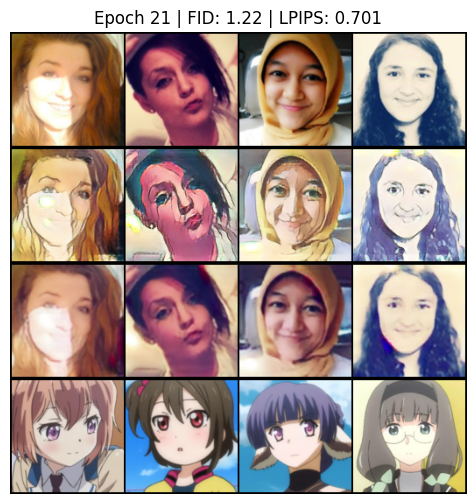

[Epoch 21] Loss_G: 3.3717 | FID: 1.222 | LPIPS: 0.701 | Time: 4.00 min


[Epoch 22/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


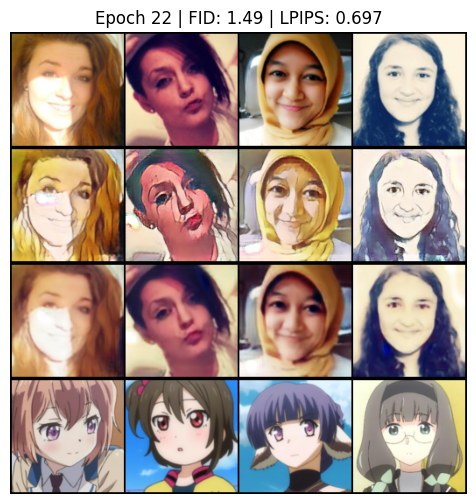

[Epoch 22] Loss_G: 3.1958 | FID: 1.487 | LPIPS: 0.697 | Time: 4.00 min


[Epoch 23/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


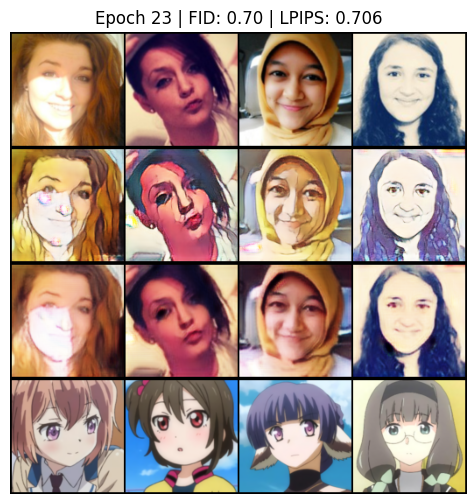

[Epoch 23] Loss_G: 3.1121 | FID: 0.702 | LPIPS: 0.706 | Time: 4.00 min


[Epoch 24/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


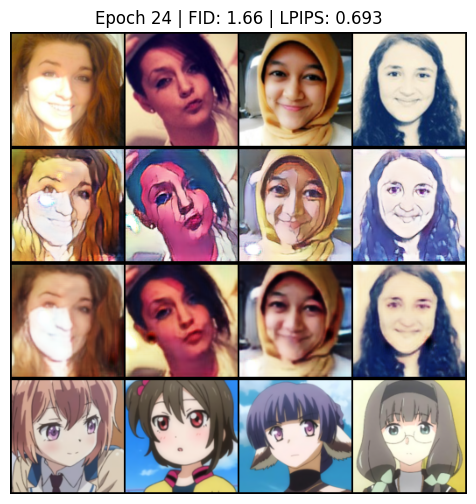

[Epoch 24] Loss_G: 3.1523 | FID: 1.661 | LPIPS: 0.693 | Time: 4.00 min


[Epoch 25/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


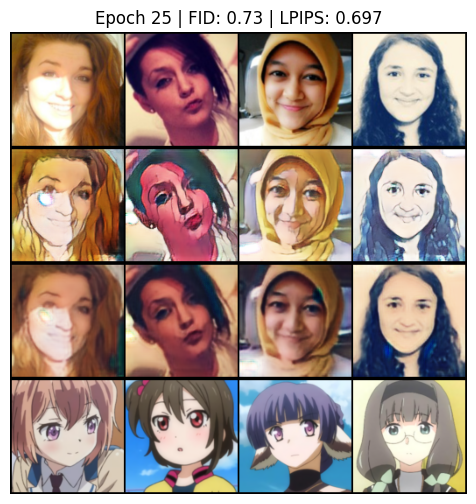

[Epoch 25] Loss_G: 3.1910 | FID: 0.733 | LPIPS: 0.697 | Time: 4.00 min


[Epoch 26/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


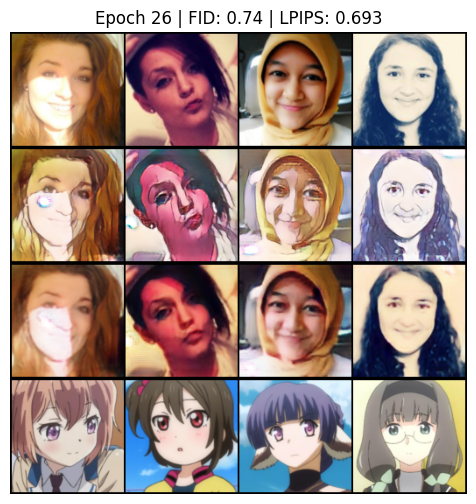

[Epoch 26] Loss_G: 3.0097 | FID: 0.741 | LPIPS: 0.693 | Time: 4.00 min


[Epoch 27/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


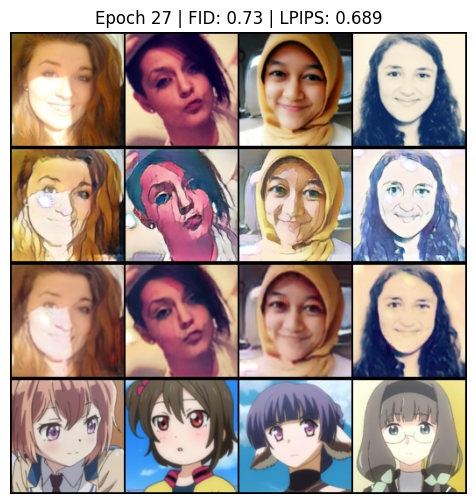

[Epoch 27] Loss_G: 3.0526 | FID: 0.731 | LPIPS: 0.689 | Time: 4.00 min


[Epoch 28/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


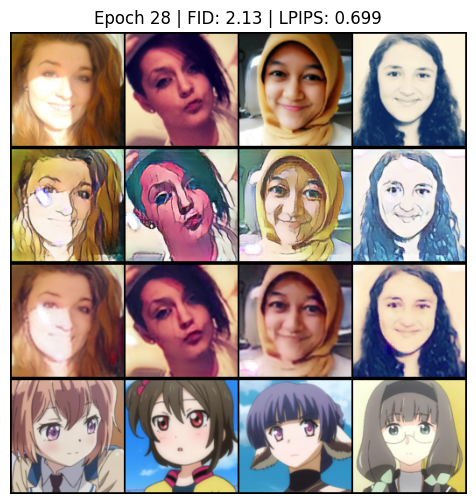

[Epoch 28] Loss_G: 3.2280 | FID: 2.130 | LPIPS: 0.699 | Time: 4.00 min


[Epoch 29/100]: 100%|██████████| 425/425 [03:58<00:00,  1.78it/s]


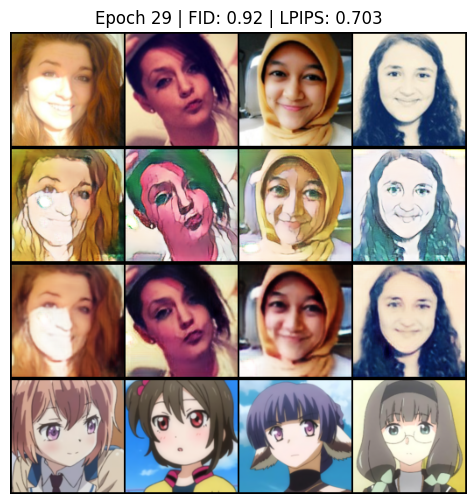

Early stopping triggered at epoch 29.


In [2]:
import os
import random
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import save_image, make_grid

from tqdm import tqdm
import lpips
from torchmetrics.image.fid import FrechetInceptionDistance

# Reproducibility
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Directories
os.makedirs("training_progress", exist_ok=True)
os.makedirs("checkpoints", exist_ok=True)

# Dataset
class Selfie2AnimeDataset(Dataset):
    def __init__(self, root, transform=None):
        self.root = root
        self.transform = transform
        self.selfie_dir = os.path.join(root, "trainA")
        self.anime_dir = os.path.join(root, "trainB")
        self.selfie_images = os.listdir(self.selfie_dir)
        self.anime_images = os.listdir(self.anime_dir)

    def __len__(self):
        return min(len(self.selfie_images), len(self.anime_images))

    def __getitem__(self, idx):
        selfie_path = os.path.join(self.selfie_dir, self.selfie_images[idx])
        anime_path = os.path.join(self.anime_dir, self.anime_images[idx])
        selfie = Image.open(selfie_path).convert("RGB")
        anime = Image.open(anime_path).convert("RGB")
        if self.transform:
            selfie = self.transform(selfie)
            anime = self.transform(anime)
        return selfie, anime

# Transform
transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

# Dataset and DataLoader
path_to_dataset = "/kaggle/input/selfie2anime"
dataset = Selfie2AnimeDataset(path_to_dataset, transform=transform)
dataloader = DataLoader(dataset, batch_size=8, shuffle=True)
fixed_batch = next(iter(DataLoader(dataset, batch_size=4, shuffle=False)))

# AnimeGAN-style Generator
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, 3),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, 3),
            nn.InstanceNorm2d(channels)
        )
    def forward(self, x): return x + self.block(x)

class AnimeGenerator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, num_res_blocks=5):
        super().__init__()
        self.initial = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_channels, 64, 7),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.down = nn.Sequential(
            nn.Conv2d(64, 128, 3, 2, 1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 256, 3, 2, 1),
            nn.InstanceNorm2d(256),
            nn.ReLU(inplace=True)
        )
        self.res_blocks = nn.Sequential(*[ResidualBlock(256) for _ in range(num_res_blocks)])
        self.up = nn.Sequential(
            nn.Upsample(scale_factor=2),
            nn.Conv2d(256, 128, 3, 1, 1),
            nn.InstanceNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Upsample(scale_factor=2),
            nn.Conv2d(128, 64, 3, 1, 1),
            nn.InstanceNorm2d(64),
            nn.ReLU(inplace=True)
        )
        self.final = nn.Sequential(
            nn.ReflectionPad2d(3),
            nn.Conv2d(64, out_channels, 7),
            nn.Tanh()
        )
    def forward(self, x):
        return self.final(self.up(self.res_blocks(self.down(self.initial(x)))))

# PatchGAN Discriminator
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Conv2d(3, 64, 4, 2, 1), nn.LeakyReLU(0.2),
            nn.Conv2d(64, 128, 4, 2, 1), nn.InstanceNorm2d(128), nn.LeakyReLU(0.2),
            nn.Conv2d(128, 1, 4, 1, 1), nn.Sigmoid()
        )
    def forward(self, x): return self.net(x)

# Initialize models
G = AnimeGenerator().to(device)
F = AnimeGenerator().to(device)
D_A = Discriminator().to(device)
D_B = Discriminator().to(device)

# Losses and optimizers
criterion_GAN = nn.MSELoss()
criterion_cycle = nn.L1Loss()
optimizer_G = optim.Adam(list(G.parameters()) + list(F.parameters()), lr=2e-4, betas=(0.5, 0.999))
optimizer_D_A = optim.Adam(D_A.parameters(), lr=2e-4, betas=(0.5, 0.999))
optimizer_D_B = optim.Adam(D_B.parameters(), lr=2e-4, betas=(0.5, 0.999))

# Metrics
fid_metric = FrechetInceptionDistance(feature=64).to(device)
lpips_metric = lpips.LPIPS(net='vgg').to(device)

def calculate_metrics(G, dataloader, device, num_samples=100):
    G.eval()
    lpips_scores = []
    with torch.no_grad():
        for i, (real_A, real_B) in enumerate(dataloader):
            if i * real_A.size(0) >= num_samples: break
            real_A, real_B = real_A.to(device), real_B.to(device)
            fake_B = G(real_A)
            fid_metric.update(((real_B * 0.5 + 0.5) * 255).byte(), real=True)
            fid_metric.update(((fake_B * 0.5 + 0.5) * 255).byte(), real=False)
            lpips_scores.append(lpips_metric(fake_B, real_B).mean().item())
    fid_score = fid_metric.compute().item()
    fid_metric.reset()
    return fid_score, np.mean(lpips_scores)

def visualize(real_A, fake_B, rec_A, real_B, epoch, fid, lpips):
    real_A = (real_A * 0.5) + 0.5
    fake_B = (fake_B * 0.5) + 0.5
    rec_A = (rec_A * 0.5) + 0.5
    real_B = (real_B * 0.5) + 0.5
    grid = torch.cat([
        make_grid(real_A, nrow=4),
        make_grid(fake_B, nrow=4),
        make_grid(rec_A, nrow=4),
        make_grid(real_B, nrow=4)
    ], dim=1)
    save_image(grid, f"training_progress/epoch_{epoch:03d}_fid_{fid:.1f}_lpips_{lpips:.3f}.png")
    npimg = grid.cpu().numpy().transpose((1, 2, 0))
    plt.figure(figsize=(16, 6))
    plt.imshow(np.clip(npimg, 0, 1))
    plt.axis('off')
    plt.title(f"Epoch {epoch} | FID: {fid:.2f} | LPIPS: {lpips:.3f}")
    plt.show()

# Training loop (no early stopping)
epochs = 100
save_interval = 10
resume = True
checkpoint_epoch = 50

if resume:
    G.load_state_dict(torch.load(f"checkpoints/G_epoch_{checkpoint_epoch}.pt", map_location=device))
    F.load_state_dict(torch.load(f"checkpoints/F_epoch_{checkpoint_epoch}.pt", map_location=device))
    start_epoch = checkpoint_epoch + 1
    print(f"Resumed training from epoch {start_epoch}")
else:
    start_epoch = 1

for epoch in range(start_epoch, epochs + 1):
    start_time = time.time()
    G.train(); F.train()
    for real_A, real_B in tqdm(dataloader, desc=f"[Epoch {epoch}/{epochs}]"):
        real_A, real_B = real_A.to(device), real_B.to(device)

        # Train generators
        optimizer_G.zero_grad()
        fake_B, rec_A = G(real_A), F(G(real_A))
        fake_A, rec_B = F(real_B), G(F(real_B))
        loss_GAN_A = criterion_GAN(D_B(fake_B), torch.ones_like(D_B(fake_B)))
        loss_GAN_B = criterion_GAN(D_A(fake_A), torch.ones_like(D_A(fake_A)))
        loss_cycle_A = criterion_cycle(rec_A, real_A)
        loss_cycle_B = criterion_cycle(rec_B, real_B)
        loss_G = loss_GAN_A + loss_GAN_B + 10 * (loss_cycle_A + loss_cycle_B)
        loss_G.backward(); optimizer_G.step()

        # Train D_A
        optimizer_D_A.zero_grad()
        loss_D_A = 0.5 * (
            criterion_GAN(D_A(real_A), torch.ones_like(D_A(real_A))) +
            criterion_GAN(D_A(fake_A.detach()), torch.zeros_like(D_A(fake_A)))
        )
        loss_D_A.backward(); optimizer_D_A.step()

        # Train D_B
        optimizer_D_B.zero_grad()
        loss_D_B = 0.5 * (
            criterion_GAN(D_B(real_B), torch.ones_like(D_B(real_B))) +
            criterion_GAN(D_B(fake_B.detach()), torch.zeros_like(D_B(fake_B)))
        )
        loss_D_B.backward(); optimizer_D_B.step()

    # Evaluation
    fid_score, lpips_score = calculate_metrics(G, dataloader, device)
    G.eval(); F.eval()
    with torch.no_grad():
        real_A, real_B = fixed_batch
        real_A, real_B = real_A.to(device), real_B.to(device)
        fake_B, rec_A = G(real_A), F(G(real_A))
        visualize(real_A, fake_B, rec_A, real_B, epoch, fid_score, lpips_score)

    # Save checkpoints
    if epoch % save_interval == 0:
        torch.save(G.state_dict(), f"checkpoints/G_epoch_{epoch}.pt")
        torch.save(F.state_dict(), f"checkpoints/F_epoch_{epoch}.pt")

    print(f"[Epoch {epoch}] Loss_G: {loss_G.item():.4f} | FID: {fid_score:.3f} | LPIPS: {lpips_score:.3f} | Time: {(time.time()-start_time)/60:.2f} min")


In [ ]:
pip install lpips torch-fidelity torchmetrics
